# Методы ускорения диффузионных моделей

В данном ноутбуке мы кратко опишем некоторые из существующих методов ускорения диффузионных моделей для задачи text-to-image. Мы опробуем реализованные методы из библиотеки `diffusers` на модели Stable Diffusion 1.5 и сравним их по качеству и скорости генерации.  

*Stable Diffusion* &mdash; модель из семейства LDM (Latent Diffusion Models **[1]**). Основные концептуальные отличия LDM от DDPM &mdash; генерация в латентном пространстве (изображение предварительно сжимается предобученным автокодировщиком), использование механизма cross-attention для лучшего обуславливания и кодировщик $\tau_\theta$ для условия (текстового описания), обучаемый совместно с моделью. Stable Diffusion **[2]** использует замороженный текстовый кодировщик CLIP ViT-L/14.

In [1]:
import numpy as np
import torch

In [ ]:
!pip install diffusers

In [ ]:
from diffusers import DiffusionPipeline


model_ckpt = "stable-diffusion-v1-5/stable-diffusion-v1-5"
pipeline = DiffusionPipeline.from_pretrained(model_ckpt).to("cuda")

In [3]:
prompts = [
    "portrait photo of a old warrior chief",
    "a golden vase with different flowers",
    "a futuristic cityscape at sunset",
    "a serene forest with a misty lake",
    "a medieval knight in shining armor",
    "a cozy cabin in the snowy mountains",
    "a vibrant market in a bustling town",
    "a mystical dragon flying over a castle",
    "a vintage car on a desert road",
    "a bowl of fresh fruit on a wooden table",
]

In [4]:
def get_args(prompts, seed=0, num_inference_steps=20):
    generator = len(prompts) * [torch.Generator("cuda").manual_seed(seed)]
    return {
        "prompt": prompts,
        "generator": generator,
        "num_inference_steps": num_inference_steps,
        "output_type": "np",
    }

В качестве метрики мы будем использовать *CLIP score* &mdash; нормированное косинусное расстояние между изображением и текстовым описанием в совместном пространстве представлений модели CLIP. В рамках этого задания мы будем использовать 10 промптов, хотя по-хорошему их должно быть сильно больше. Для каждого промпта будем генерировать одно изображение.

In [5]:
from torchmetrics.functional.multimodal import clip_score
from functools import partial


clip_score_fn = partial(clip_score, model_name_or_path="openai/clip-vit-base-patch16")


def calculate_clip_score(images, prompts):
    images_int = (images * 255).astype("uint8")
    clip_score = clip_score_fn(torch.from_numpy(images_int).permute(0, 3, 1, 2), prompts).detach()
    return round(float(clip_score), 4)

Чтобы избежать OOM, будем использовать sliced attention computation. Большая часть памяти потребляется как раз слоями cross-attention. Входной тензор можно разбить на блоки и вычислять attention последовательно. Так мы экономим память, тратя чуть больше времени.

In [6]:
pipeline.enable_attention_slicing()

In [7]:
%%time

images = pipeline(**get_args(prompts[:4], seed=0, num_inference_steps=20)).images

  0%|          | 0/20 [00:00<?, ?it/s]

CPU times: user 31.4 s, sys: 10.4 s, total: 41.7 s
Wall time: 42.2 s


In [9]:
sd_clip_score = calculate_clip_score(images, prompts[:4])
print(f"CLIP score: {sd_clip_score}")

CLIP score: 32.9015


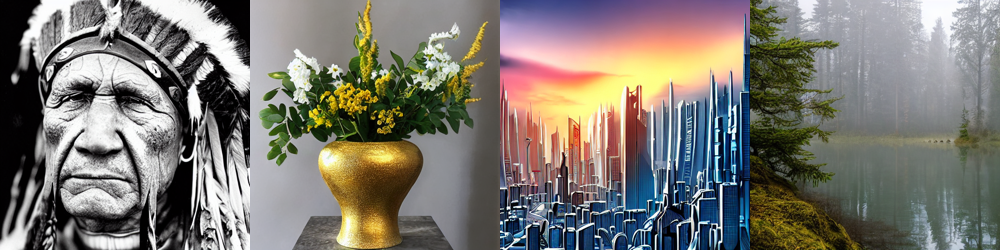

In [13]:
from PIL import Image
from diffusers.utils import make_image_grid


def np2pil(images):
    return [Image.fromarray(np.uint8(image * 255)) for image in images]


make_image_grid(np2pil(images), 1, 4, 250)

**SD full fp32 PNDM N=20**  

**time: 10.55s (в среднем на изображение)  
score: 32.9015**

## Переход к fp16

Элементарная квантизация fp32 $\to$ fp16 позволяет существенно увеличить скорость генерации, при этом практически не жертвуя качеством.

In [15]:
pipeline = DiffusionPipeline.from_pretrained(model_ckpt, torch_dtype=torch.float16).to("cuda")
pipeline.enable_attention_slicing()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [16]:
%%time

images = pipeline(**get_args(prompts, seed=0, num_inference_steps=20)).images

  0%|          | 0/20 [00:00<?, ?it/s]

CPU times: user 32.2 s, sys: 13.8 s, total: 46 s
Wall time: 46.1 s


In [17]:
sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 32.3961


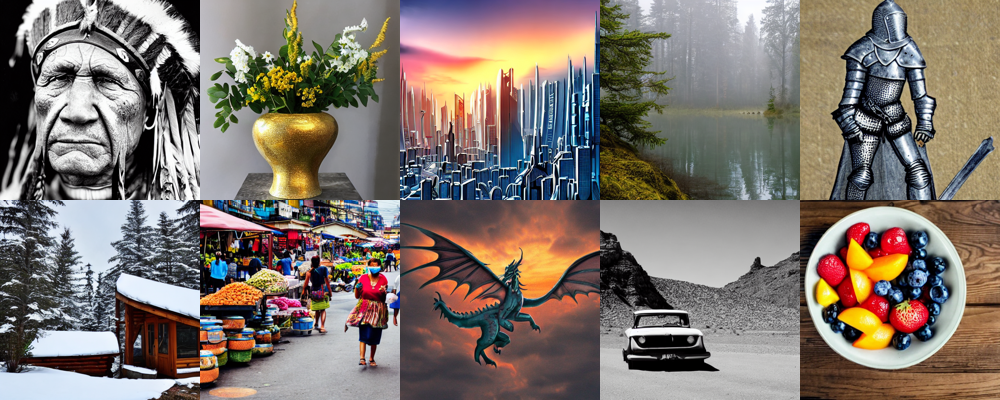

In [19]:
make_image_grid(np2pil(images), 2, 5, 200)

**SD full fp16 PNDM N=20**  

**time: 4.61s (x2.28)  
score: 32.3961 (-0.5)**  

Возьмем эту конфигурацию в качестве бейзлайна.

## Schedulers

Как было показано в статье EDM **[3]**, U-Net просто оценивает score функцию, а решать обратное SDE в принципе можно любым методом. В `diffusers` за метод численного интегрирования, сетку времен и расписания $\sigma(t), s(t)$ отвечают Schedulers. Очевидно, эти компоненты напрямую влияют на скорость генерации.

In [20]:
pipeline.scheduler.compatibles

[diffusers.schedulers.scheduling_euler_discrete.EulerDiscreteScheduler,
 diffusers.schedulers.scheduling_dpmsolver_multistep.DPMSolverMultistepScheduler,
 diffusers.schedulers.scheduling_k_dpm_2_discrete.KDPM2DiscreteScheduler,
 diffusers.schedulers.scheduling_edm_euler.EDMEulerScheduler,
 diffusers.schedulers.scheduling_unipc_multistep.UniPCMultistepScheduler,
 diffusers.schedulers.scheduling_heun_discrete.HeunDiscreteScheduler,
 diffusers.schedulers.scheduling_k_dpm_2_ancestral_discrete.KDPM2AncestralDiscreteScheduler,
 diffusers.utils.dummy_torch_and_torchsde_objects.DPMSolverSDEScheduler,
 diffusers.schedulers.scheduling_dpmsolver_singlestep.DPMSolverSinglestepScheduler,
 diffusers.schedulers.scheduling_lms_discrete.LMSDiscreteScheduler,
 diffusers.schedulers.scheduling_ddpm.DDPMScheduler,
 diffusers.schedulers.scheduling_ddim.DDIMScheduler,
 diffusers.schedulers.scheduling_pndm.PNDMScheduler,
 diffusers.schedulers.scheduling_deis_multistep.DEISMultistepScheduler,
 diffusers.schedu

In [21]:
from diffusers import DDIMScheduler, HeunDiscreteScheduler, DPMSolverSinglestepScheduler

`DDIMScheduler` &mdash; расписание из статьи **[4]**, $\sigma(t)=t$, $s(t)=1$. Считается хорошим выбором на практике.

In [22]:
pipeline.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)

In [23]:
%%time

images = pipeline(**get_args(prompts, seed=0, num_inference_steps=20)).images

  0%|          | 0/20 [00:00<?, ?it/s]

CPU times: user 30.9 s, sys: 13.4 s, total: 44.3 s
Wall time: 44.2 s


In [24]:
sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 32.042


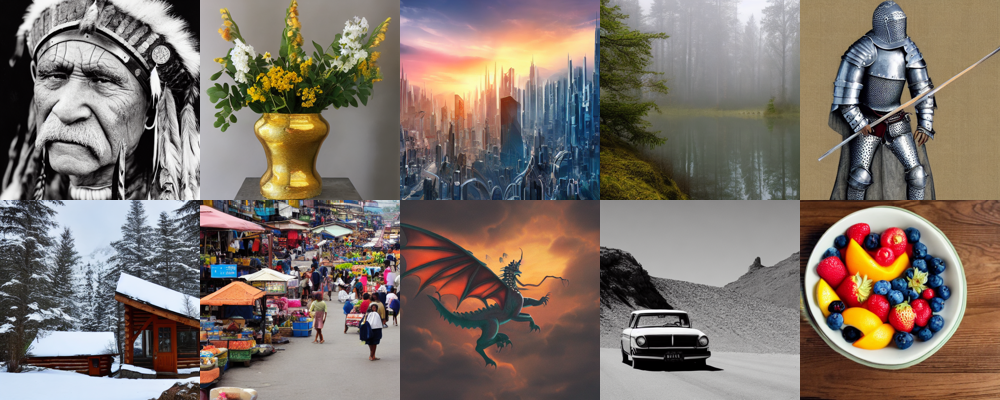

In [25]:
make_image_grid(np2pil(images), 2, 5, 200)

**SD full fp16 DDIM N=20**  

**time: 4.42s (x1.04)  
speed: 32.042 (-0.35)**  

Получили крохотный прирост в скорости, но качество немного просело.

`HeunDiscreteScheduler` &mdash; детерминированный сэмплер из работы **[3]** (алгоритм 1). В отличие от DDIM, тут используется метод Гойна второго порядка и другая сетка времен.

In [29]:
pipeline.scheduler = HeunDiscreteScheduler.from_config(pipeline.scheduler.config)

In [30]:
%%time

images = pipeline(**get_args(prompts, seed=0, num_inference_steps=20)).images

  0%|          | 0/20 [00:00<?, ?it/s]

CPU times: user 44.5 s, sys: 37.5 s, total: 1min 22s
Wall time: 1min 21s


In [31]:
sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 32.1586


Долговато получилось (метод Гойна вызывает модель дважды за шаг). Уменьшим число шагов до 10.

In [32]:
%%time

images = pipeline(**get_args(prompts, seed=0, num_inference_steps=10)).images

  0%|          | 0/10 [00:00<?, ?it/s]

CPU times: user 23.8 s, sys: 18.3 s, total: 42.1 s
Wall time: 42 s


In [33]:
sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 32.2205


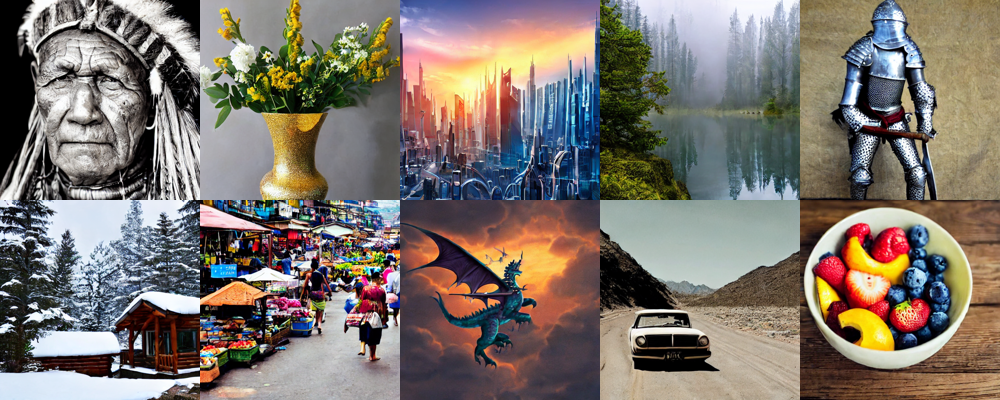

In [34]:
make_image_grid(np2pil(images), 2, 5, 200)

**SD full fp16 Heun N=10**

**time: 4.2s (x1.097)  
speed: 32.2205 (-0.1756)**

`DPMSolverSinglestepScheduler` &mdash; семейство методов высшего порядка, предложенных в работе **[5]** (мы используем порядок $k=2$). Авторы утверждают, что этот сэмплер может генерировать изображения приличного качества всего за 10 шагов.

In [36]:
pipeline.scheduler = DPMSolverSinglestepScheduler.from_config(pipeline.scheduler.config)

In [37]:
%%time

images = pipeline(**get_args(prompts, seed=0, num_inference_steps=20)).images

 `last_sigmas_type='zero'` is not supported for `lower_order_final=False`. Changing scheduler {self.config} to have `lower_order_final` set to True.


  0%|          | 0/20 [00:00<?, ?it/s]

CPU times: user 25.1 s, sys: 19 s, total: 44 s
Wall time: 43.9 s


In [38]:
sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 32.2009


При $N=20$ качество получилось чуть хуже, чем у предыдущего сэмплера. Попробуем уменьшить до 10.

In [39]:
%%time

images = pipeline(**get_args(prompts, seed=0, num_inference_steps=10)).images

  0%|          | 0/10 [00:00<?, ?it/s]

CPU times: user 14.5 s, sys: 9.2 s, total: 23.7 s
Wall time: 23.6 s


In [40]:
sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 32.0405


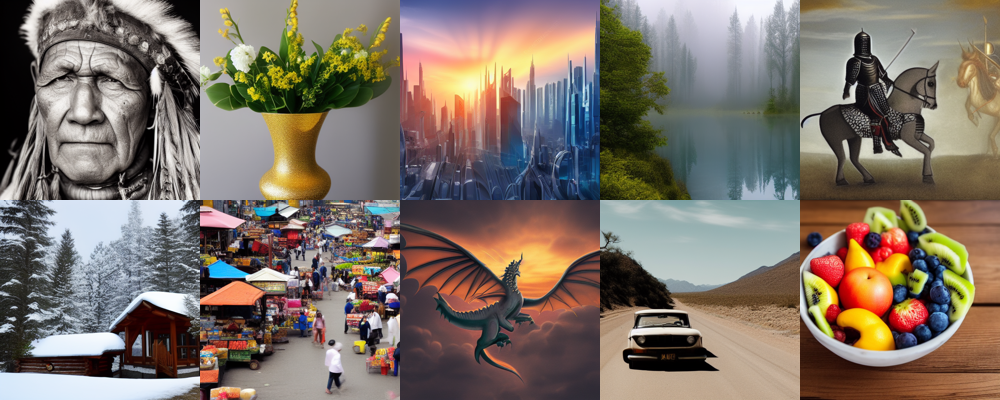

In [41]:
make_image_grid(np2pil(images), 2, 5, 200)

**SD full fp16 DPMSolver N=10**  

**time: 2.36s (x1.95)  
score: 32.0405 (-0.36)**  

Получилось существенно быстрее, но качество заметно просело.  
**Итого, лучший scheduler &mdash; `HeunDiscreteScheduler`.**

## Дистилляция

Один из наиболее популярных методов ускорения ДМ &mdash; дистилляция сети. Базовая идея следующая: маленькая модель-студент обучается предсказывать за пару шагов выход большой модели-учителя, сделанный за много шагов **[6]**.  

В `diffusers` уже есть готовые дистиллированные модели. Рассмотрим `nota-ai/bk-sdm-small` (на основе Stable Diffusion v1.4).

In [ ]:
from diffusers import StableDiffusionPipeline


pipeline = StableDiffusionPipeline.from_pretrained("nota-ai/bk-sdm-small", torch_dtype=torch.float16).to("cuda")
pipeline.enable_attention_slicing()

In [43]:
%%time

images = pipeline(**get_args(prompts, seed=0, num_inference_steps=20)).images

  0%|          | 0/20 [00:00<?, ?it/s]

CPU times: user 23.7 s, sys: 5.96 s, total: 29.7 s
Wall time: 29.6 s


In [44]:
sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 32.0807


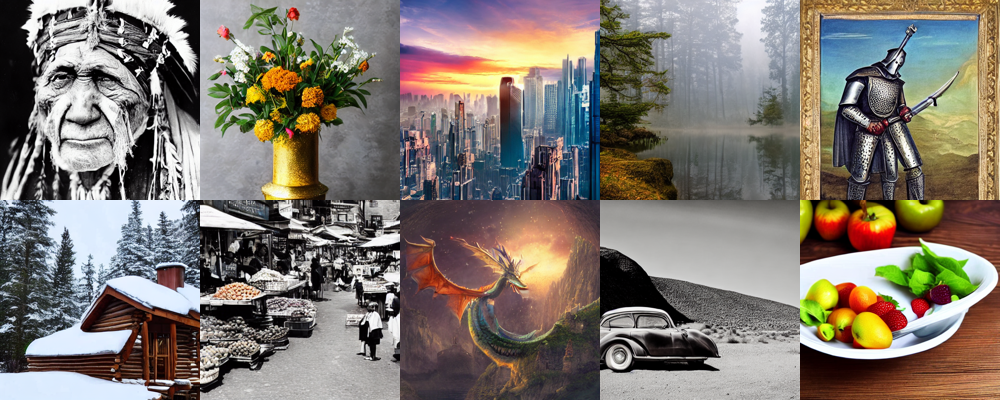

In [45]:
make_image_grid(np2pil(images), 2, 5, 200)

Качество заметно упало. Посмотрим, что будет, если заменить scheduler.

In [46]:
pipeline.scheduler = HeunDiscreteScheduler.from_config(pipeline.scheduler.config)

In [47]:
%%time

images = pipeline(**get_args(prompts, seed=0, num_inference_steps=10)).images

  0%|          | 0/10 [00:00<?, ?it/s]

CPU times: user 16.6 s, sys: 11.6 s, total: 28.2 s
Wall time: 28.2 s


In [48]:
sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 32.1642


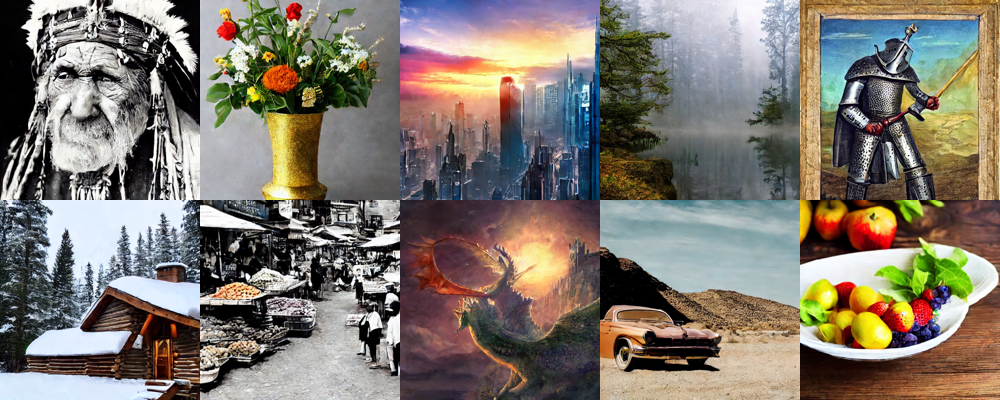

In [49]:
make_image_grid(np2pil(images), 2, 5, 200)

Все еще плохое качество (хоть и при значительном ускорении). Считаем, что в данном случае метод себя не оправдал (хотя справедливее было бы сравнивать при учителе SD v1.5, но соответствующий чекпоинт в `diffusers` мы не нашли).

## Tiny AutoEncoder

В случае LDM дистиллировать можно не только U-Net, но и автокодировщик. Снова, в `diffusers` уже имеется готовое решение.

In [50]:
from diffusers import AutoencoderTiny


pipeline = DiffusionPipeline.from_pretrained(model_ckpt, torch_dtype=torch.float16).to("cuda")
pipeline.vae = AutoencoderTiny.from_pretrained(
    "sayakpaul/taesd-diffusers", torch_dtype=torch.float16,
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/9.79M [00:00<?, ?B/s]

In [51]:
pipeline.enable_attention_slicing()

In [55]:
%%time

images = pipeline(**get_args(prompts, seed=1, num_inference_steps=20)).images

  0%|          | 0/20 [00:00<?, ?it/s]

CPU times: user 29.3 s, sys: 14.1 s, total: 43.5 s
Wall time: 43.4 s


(здесь нам пришлось поменять seed, т.к. по какой-то причине на картинке с рыцарем был обнаружен NSFW контент...)

In [56]:
sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 32.0148


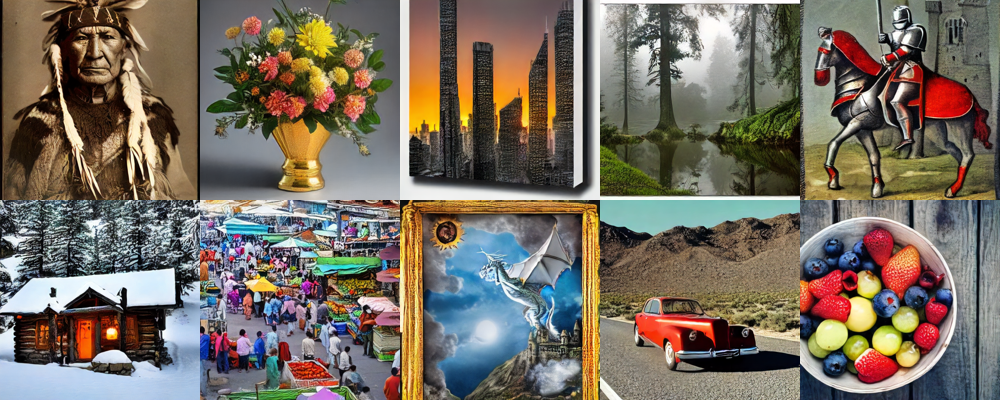

In [57]:
make_image_grid(np2pil(images), 2, 5, 200)

In [58]:
pipeline.scheduler = HeunDiscreteScheduler.from_config(pipeline.scheduler.config)

In [59]:
%%time

images = pipeline(**get_args(prompts, seed=0, num_inference_steps=10)).images

  0%|          | 0/10 [00:00<?, ?it/s]

CPU times: user 20.9 s, sys: 18.4 s, total: 39.3 s
Wall time: 39.2 s


In [60]:
sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 32.1057


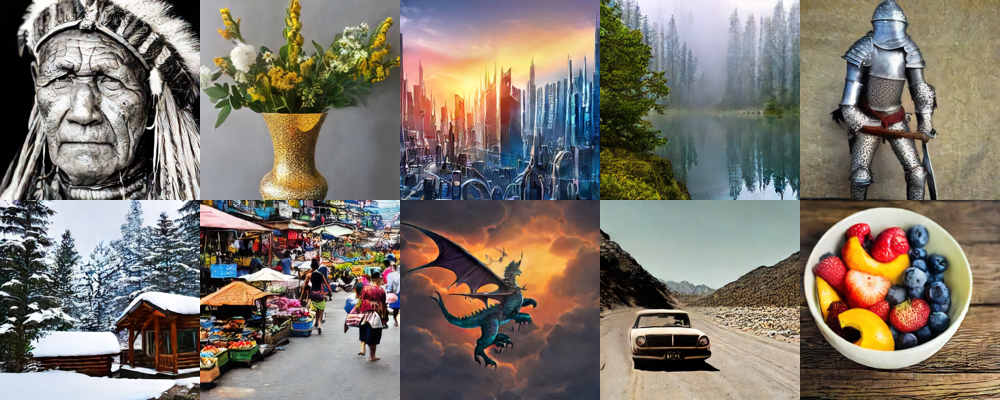

In [61]:
make_image_grid(np2pil(images), 2, 5, 200)

**SD tinyVAE fp16 Heun N=10**

**time: 3.92s (x1.176)  
score: 32.1057 (-0.29)**  

С маленьким VAE получилось быстрее в среднем на 0.3 секунды, чем с обычным, хотя качество упало еще на 0.07.

## LCM-LoRA

*Consistency models* **[7]** &mdash; метод генерации в ДМ за малое число шагов, основанный на обучении семейства функций, отображающих любую точку $x_t$ на траектории probability flow ODE сразу в начальную точку $x_0$.  

*LCM (Latent consistency models)* **[8]** &mdash; адаптация этой идеи для LDM. Здесь также используется дистилляция, которая в итоге позволяет генерировать за 4-8 шагов.    

*LoRA (Low-Rank Adaptation)* **[9]** &mdash; метод малоранговой аппроксимации для файн-тюна моделей. Вместо всей матрицы $W$ полносвязного слоя обучается лишь добавка $\Delta W$, представляемая произведением двух матриц с суммарно меньшим числом параметров.  

Опять же, уже готовая дистиллированная из Stable Diffusion v1.5 модель имеется в `diffusers`, используем ее. 

In [ ]:
!pip install -U peft

In [64]:
from diffusers import LCMScheduler


pipeline.scheduler = LCMScheduler.from_config(pipeline.scheduler.config)
pipeline.load_lora_weights("latent-consistency/lcm-lora-sdv1-5")

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


pytorch_lora_weights.safetensors:   0%|          | 0.00/135M [00:00<?, ?B/s]

In [65]:
%%time

images = pipeline(**get_args(prompts, seed=0, num_inference_steps=8), guidance_scale=1.0).images

  0%|          | 0/8 [00:00<?, ?it/s]

CPU times: user 7.7 s, sys: 2.02 s, total: 9.72 s
Wall time: 9.65 s


In [66]:
sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 31.5559


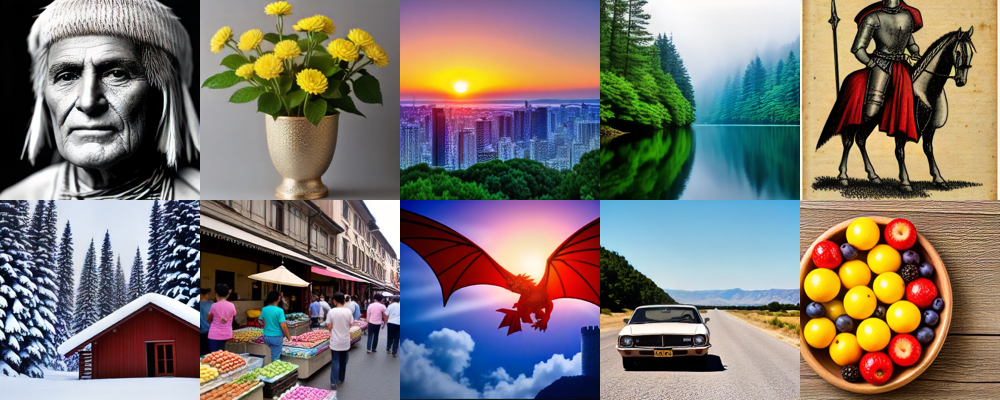

In [67]:
make_image_grid(np2pil(images), 2, 5, 200)

**SD LCM fp16 N=8 no guidance**  

**time: 0.96s (x4.8)  
score: 31.5559 (-0.84)**  

Прирост по скорости почти в 5 раз. Метрика сильно хуже, но сами изображения выглядят прилично, в отличие от тех, что были при дистилляции.

In [80]:
%%time

images = pipeline(**get_args(prompts, seed=0, num_inference_steps=8), guidance_scale=1.5).images

  0%|          | 0/8 [00:00<?, ?it/s]

CPU times: user 11.8 s, sys: 5.57 s, total: 17.3 s
Wall time: 17.2 s


In [81]:
sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 31.3358


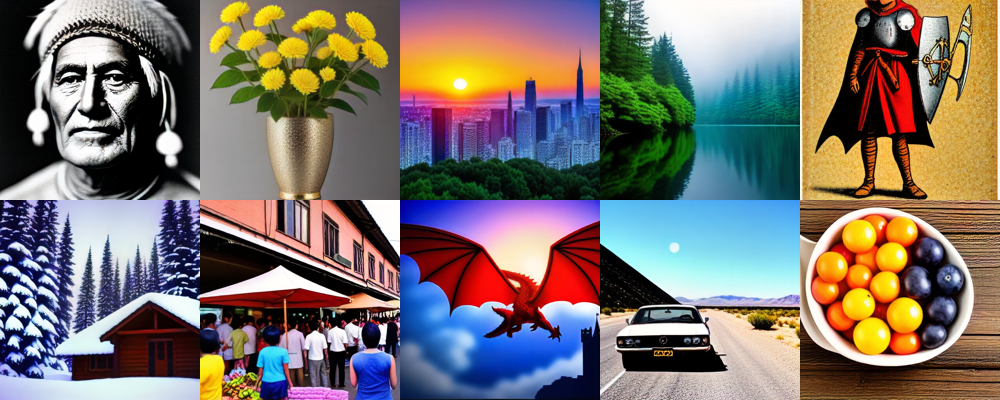

In [82]:
make_image_grid(np2pil(images), 2, 5, 200)

In [83]:
%%time

images = pipeline(**get_args(prompts, seed=0, num_inference_steps=8), guidance_scale=2.0).images

  0%|          | 0/8 [00:00<?, ?it/s]

CPU times: user 11.9 s, sys: 5.76 s, total: 17.7 s
Wall time: 17.6 s


In [84]:
sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 30.772


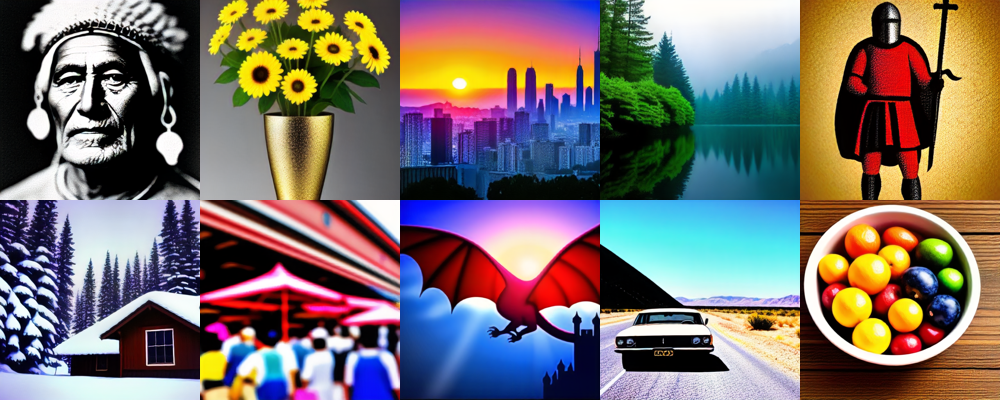

In [85]:
make_image_grid(np2pil(images), 2, 5, 200)

При включении guidance генерация становится медленнее за счет дополнительного вызова сети, и на изображениях появляются артефакты.

## DeepCache

*DeepCache* **[10]** &mdash; архитектурная оптимизация ДМ, которая кэширует и переиспользует high-level признаки в U-Net и эффективно обновляет low-level признаки.

In [ ]:
!pip install DeepCache

In [118]:
from DeepCache import DeepCacheSDHelper


def reset_dc_pipeline(cache_interval=3, cache_branch_id=0):
    pipeline = StableDiffusionPipeline.from_pretrained(model_ckpt, torch_dtype=torch.float16).to("cuda")
    pipeline.vae = AutoencoderTiny.from_pretrained(
        "sayakpaul/taesd-diffusers", torch_dtype=torch.float16,
    ).to("cuda")
    pipeline.enable_attention_slicing()
    pipeline.scheduler = HeunDiscreteScheduler.from_config(pipeline.scheduler.config)

    helper = DeepCacheSDHelper(pipe=pipeline)
    helper.set_params(
        cache_interval=cache_interval,
        cache_branch_id=cache_branch_id,
    )
    helper.enable()

Метод имеет два параметра &mdash; `cache_interval` (чем больше, тем быстрее генерация) и `cache_branch_id` (чем меньше, тем быстрее).

In [119]:
reset_dc_pipeline(cache_interval=3, cache_branch_id=0)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [91]:
%%time

images = pipeline(**get_args(prompts, seed=0, num_inference_steps=10)).images

  0%|          | 0/10 [00:00<?, ?it/s]

CPU times: user 11.5 s, sys: 3.96 s, total: 15.5 s
Wall time: 15.4 s


In [92]:
sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 32.3604


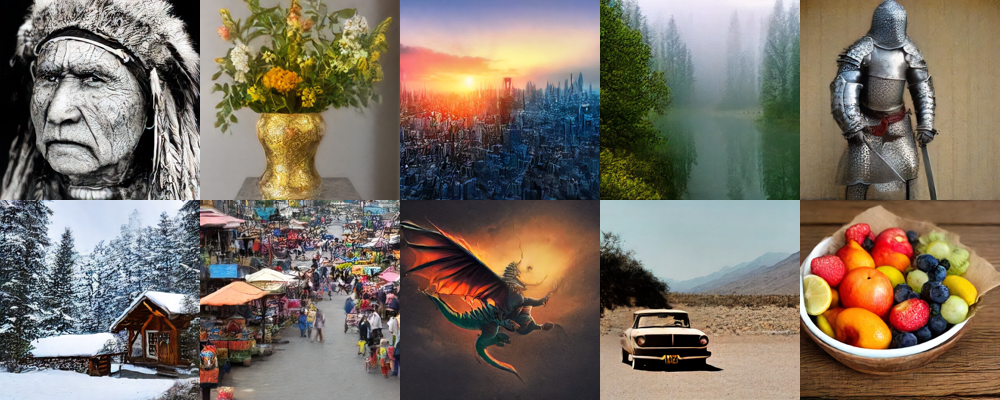

In [93]:
make_image_grid(np2pil(images), 2, 5, 200)

In [94]:
%%time

images = pipeline(**get_args(prompts, seed=0, num_inference_steps=20)).images

  0%|          | 0/20 [00:00<?, ?it/s]

CPU times: user 22 s, sys: 7.52 s, total: 29.6 s
Wall time: 29.5 s


In [95]:
sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 31.708


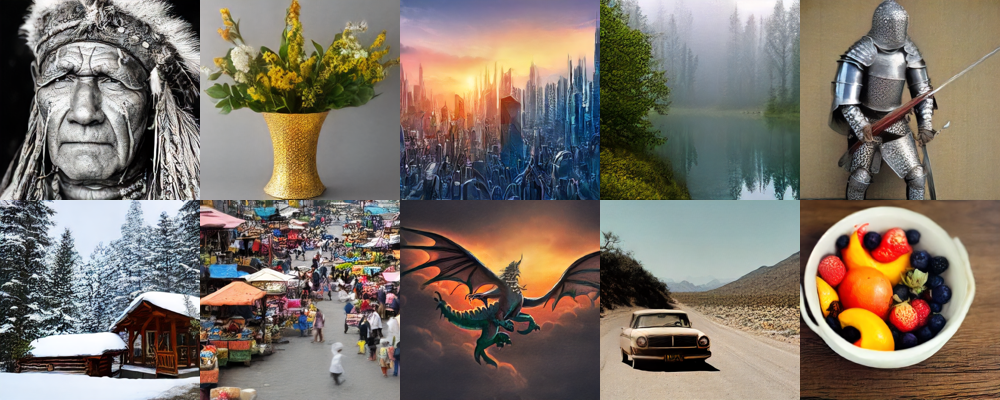

In [96]:
make_image_grid(np2pil(images), 2, 5, 200)

In [128]:
reset_dc_pipeline(cache_interval=10, cache_branch_id=0)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [129]:
%%time

images = pipeline(**get_args(prompts, seed=0, num_inference_steps=10)).images

  0%|          | 0/10 [00:00<?, ?it/s]

CPU times: user 13.4 s, sys: 4.75 s, total: 18.1 s
Wall time: 18 s


In [130]:
sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 32.3604


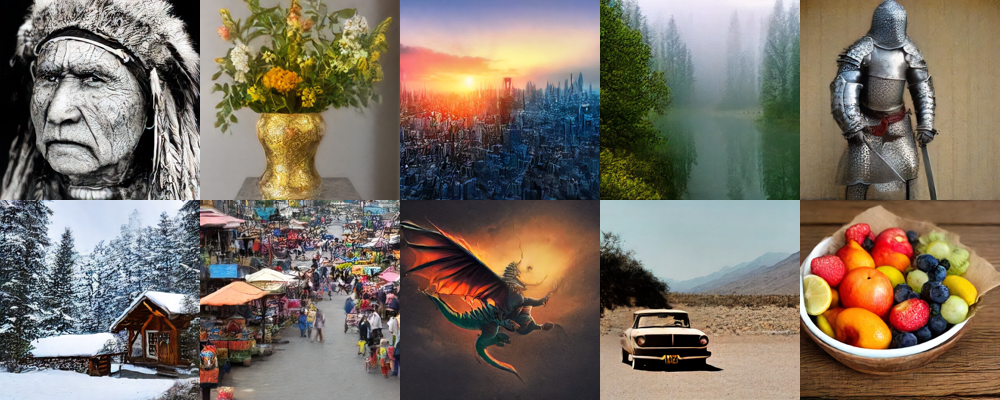

In [131]:
make_image_grid(np2pil(images), 2, 5, 200)

**SD tinyVAE fp16 Heun DeepCache 10,0 N=10**  

**time: 1.8s (x2.56)  
score: 32.3604 (-0.035)**  

Кажется, эта конфигурация дала наилучший компромисс между качеством и скоростью. Метрика отличается от бейзлайна лишь на сотые, а скорость увеличилась в 2.5 раза.

Итак, мы затронули 3 группы стратегий ускорения ДМ &mdash; **дистилляция**, **schedulers** и **архитектурные оптимизации**. Оптимальный результат конкретно в нашем эксперименте дала комбинация всех этих стратегий. При этом не все из рассмотренных методов давали приемлемое качество (например, дистилляция U-Net). Возможно, она будет работать лучше для модели побольше.

Ноутбук был сделан на основе следующих туториалов:  

1. [Evaluating Diffusion Models](https://huggingface.co/docs/diffusers/v0.21.0/conceptual/evaluation);  
2. [Effective and efficient diffusion](https://huggingface.co/docs/diffusers/stable_diffusion);  
3. [Speed up inference](https://huggingface.co/docs/diffusers/optimization/fp16);  
4. [Performing inference with LCM-LoRA](https://huggingface.co/docs/diffusers/main/en/using-diffusers/inference_with_lcm_lora);  
5. [DeepCache](https://huggingface.co/docs/diffusers/optimization/deepcache).

**Список литературы**  

**[1]** [High-Resolution Image Synthesis with Latent Diffusion Models](https://arxiv.org/abs/2112.10752);  
**[2]** [Stable Diffusion](https://github.com/CompVis/stable-diffusion);  
**[3]** [Elucidating the Design Space of Diffusion-Based Generative Models](https://arxiv.org/abs/2206.00364);  
**[4]** [Denoising Diffusion Implicit Models](https://arxiv.org/abs/2010.02502);  
**[5]** [DPM-Solver: A Fast ODE Solver for Diffusion Probabilistic Model Sampling in Around 10 Steps](https://arxiv.org/abs/2206.00927);  
**[6]** [Progressive Distillation for Fast Sampling of Diffusion Models](https://arxiv.org/abs/2202.00512);  
**[7]** [Consistency Models](https://arxiv.org/abs/2303.01469);  
**[8]** [Latent Consistency Models: Synthesizing High-Resolution Images with Few-Step Inference](https://arxiv.org/abs/2310.04378);  
**[9]** [LoRA: Low-Rank Adaptation of Large Language Models](https://arxiv.org/abs/2106.09685);  
**[10]** [DeepCache: Accelerating Diffusion Models for Free](https://arxiv.org/abs/2312.00858).